In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

In [2]:
dataset = pd.read_csv('/Users/csuen/Desktop/Sun-NG-24/radicals/UKESM1-0-LL_2010_2014(ver231209).csv')

In [322]:
dataset.to_csv('/Users/csuen/Desktop/Sun-NG-24/radicals/UKESM1-0-LL_2010_2014(ver231212).csv', index=False)

In [ ]:
land = pd.read_csv('/Users/csuen/Documents/GitHub/ozone-budget/global_grid_2x2_label_continent.csv')

In [36]:
dataset_land = dataset.merge(land, how='left', left_on=['longitude','latitude'], right_on=['longitude','latitude'])
dataset_land = dataset_land[dataset_land['land_global']==1]

In [3]:
list(dataset)

['longitude',
 'latitude',
 't',
 'loc',
 'o3',
 'o3prod',
 'o3loss',
 'eminox',
 'emivoc',
 'tas',
 'hus',
 'aod',
 'bldep',
 'ua',
 'va',
 'ps',
 'jno2',
 'photo1d',
 'lossch4',
 'lossco',
 'no2',
 'no',
 'oh',
 'h2o',
 'pan',
 'hno3',
 'co',
 'hcho',
 'ch4',
 'ch3o2_mod',
 'ho2_mod',
 'o1d_mod',
 'o3_mole',
 'no2_mole',
 'no_mole',
 'h2o_mole',
 'co_mole',
 'hcho_mole',
 'oh_mole',
 'n2_mole',
 'o2_mole',
 'lossco_mole',
 'lossch4_mole',
 'o1d_mole',
 'ho2_mole',
 'ch3o2_mole',
 'ch3ooh_mole',
 'o1d_mod_vmr',
 'ho2_mod_vmr',
 'ch3o2_mod_vmr',
 'o1d_vmr',
 'ho2_vmr',
 'ch3o2_vmr',
 'o1d_mod_mole',
 'ho2_mod_mole',
 'ch3o2_mod_mole',
 'o1d_mole_adj',
 'ho2_mole_adj',
 'ch3o2_mole_adj',
 'k1',
 'k2',
 'k3',
 'k4',
 'k5',
 'k6',
 'k7',
 'k8',
 'k9',
 'k9a',
 'k9b',
 'k10',
 'k11',
 'k12',
 'k13',
 'k14',
 'k15',
 'k15a',
 'k15b',
 'k16',
 'pt1',
 'pt2',
 'pt4',
 'pt5',
 'pt6',
 'o3prod_mole',
 'o3loss_mole',
 'pt3',
 'pt7',
 'pt3_adj',
 'pt7_adj',
 'o3prod_mole_adj',
 'o3loss_mole_adj',

In [40]:
print(dataset_land['o1d_mole'].min())
print(dataset_land['o1d_mole'].mean())
print(dataset_land['o1d_mole'].max())
print(dataset_land['o1d_mole_adj'].min())
print(dataset_land['o1d_mole_adj'].mean())
print(dataset_land['o1d_mole_adj'].max())

0.0
0.007225720466681534
0.0679607858380905
0.0
0.0072257204666812845
0.04441138913224258


In [41]:
print(dataset_land['ho2_mole'].min())
print(dataset_land['ho2_mole'].mean())
print(dataset_land['ho2_mole'].max())
print(dataset_land['ho2_mole_adj'].min())
print(dataset_land['ho2_mole_adj'].mean())
print(dataset_land['ho2_mole_adj'].max())

0.5649296213621601
39759858.50353865
424489312.981939
92.77340215845338
39759858.503539726
185557225.73956758


In [43]:
print(dataset_land['ch3o2_mole'].min())
print(dataset_land['ch3o2_mole'].mean())
print(dataset_land['ch3o2_mole'].max())
print(np.nanpercentile(dataset_land['ch3o2_mole'],95))
print(dataset_land['ch3o2_mole_adj'].min())
print(dataset_land['ch3o2_mole_adj'].mean())
print(dataset_land['ch3o2_mole_adj'].max())
print(np.nanpercentile(dataset_land['ch3o2_mole_adj'],95))

0.0909073673831188
16244733.1420634
445910764.4299986
74710802.44852325
468.4314648491951
16244733.142063154
80549283.39385687
46263241.61028204


In [32]:
dataset['o1d_mole_adj'] = dataset['o1d_mod_mole']/0.021422472512675973*0.007225720466681534

In [33]:
dataset['ho2_mole_adj'] = dataset['ho2_mod_mole']/124621662.39481716*39759858.50353865

In [34]:
dataset['ch3o2_mole_adj'] = dataset['ch3o2_mod_mole']/56658312.672177136*16244733.1420634

In [324]:
print(1/0.021422472512675973*0.007225720466681534)
print(1/124621662.39481716*39759858.50353865)
print(1/56658312.672177136*16244733.1420634)

0.3372962883908931
0.31904452034650604
0.2867140296968393


In [44]:
dataset['o1d_vmr_adj'] = dataset['o1d_mole_adj']/(6.022*10**23*dataset['ps']/8.314/dataset['tas'])*10**6
dataset['ho2_vmr_adj'] = dataset['ho2_mole_adj']/(6.022*10**23*dataset['ps']/8.314/dataset['tas'])*10**6
dataset['ch3o2_vmr_adj'] = dataset['ch3o2_mole_adj']/(6.022*10**23*dataset['ps']/8.314/dataset['tas'])*10**6

In [47]:
dataset_land = dataset.merge(land, how='left', left_on=['longitude','latitude'], right_on=['longitude','latitude'])
dataset_land = dataset_land[dataset_land['land_global']==1]

### 绘制全球自由基年均浓度分布图

(-90.0, 90.0)

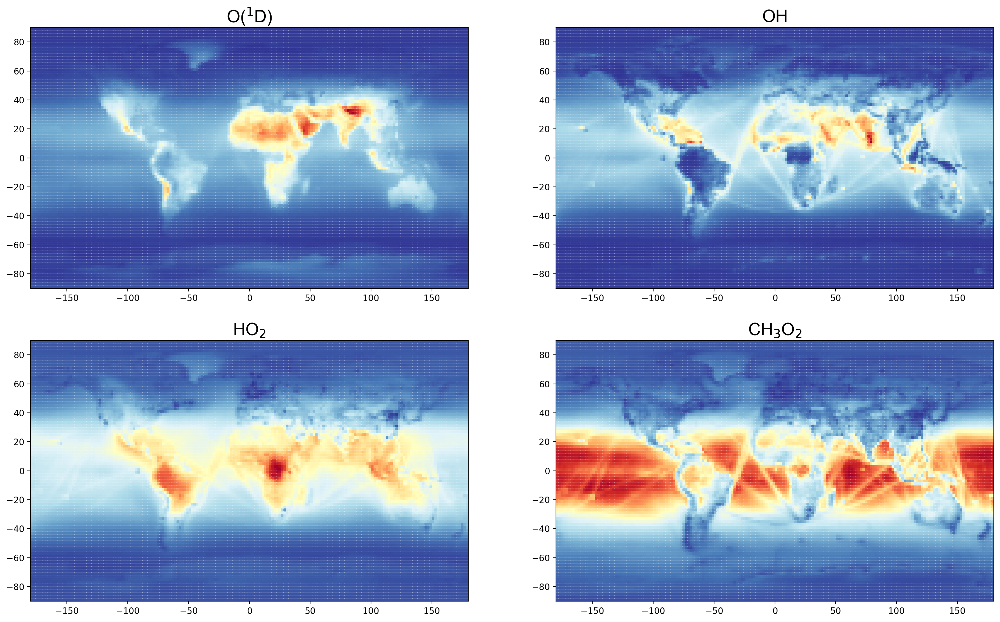

In [45]:
temp = dataset.groupby('loc').mean()

plt.figure(num=None, figsize=(20, 12), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(2,2,1)
plt.title('O(${^1}$D)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o1d_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,2)
plt.title('OH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,3)
plt.title('HO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,4)
plt.title('CH${_3}$O${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ch3o2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

In [ ]:
land = pd.read_csv('/Users/csuen/Desktop/Tools Research/global_grid_2x2_label.csv')

dataset_land = dataset.merge(land, how='left', left_on=['longitude','latitude'], right_on=['longitude','latitude'])
dataset_land = dataset_land[dataset_land['land_global']==1]

(-90.0, 90.0)

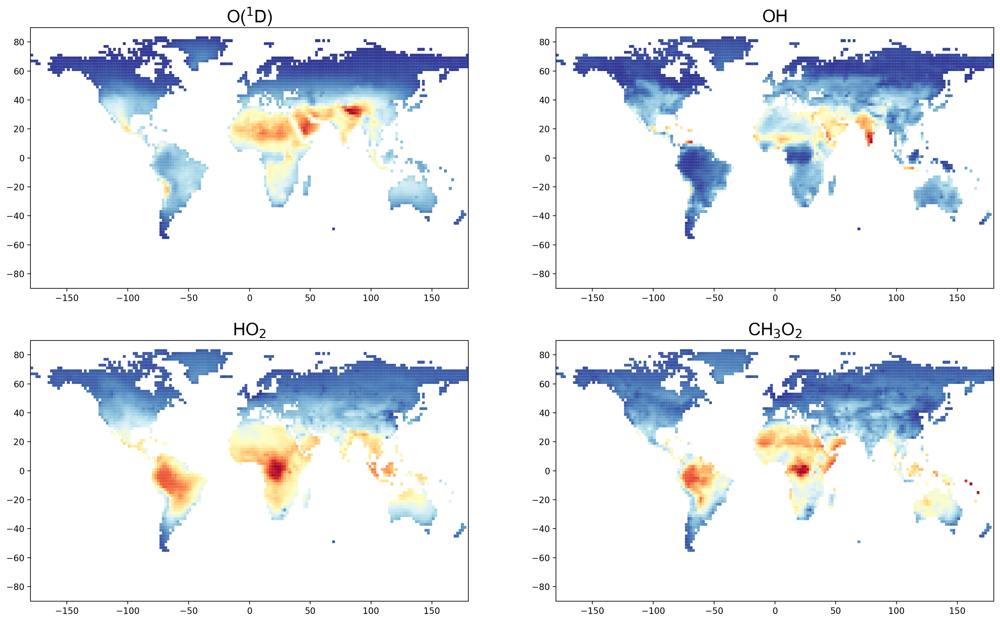

In [48]:
temp_land = dataset_land.groupby('loc_x').mean()

plt.figure(num=None, figsize=(20, 12), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp_land['longitude']
y = temp_land['latitude']

plt.subplot(2,2,1)
plt.title('O(${^1}$D)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['o1d_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,2)
plt.title('OH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['oh'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,3)
plt.title('HO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['ho2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,4)
plt.title('CH${_3}$O${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['ch3o2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

In [49]:
print("Mean: "+str(temp_land['o1d_mole_adj'].mean()*10**(3)))
print("Std: "+str(temp_land['o1d_mole_adj'].std()*10**(3)))
print("Median: "+str(temp_land['o1d_mole_adj'].median()*10**(3)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['o1d_mole_adj'],25)*10**(3)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['o1d_mole_adj'],75)*10**(3)))

Mean: 7.225720466681392
Std: 5.611081955191368
Median: 6.537373024287352
5th Percentile: 1.7190428007031495
95th Percentile: 11.017187063702176


In [50]:
print("Mean: "+str(temp_land['oh_mole'].mean()*10**(-6)))
print("Std: "+str(temp_land['oh_mole'].std()*10**(-6)))
print("Median: "+str(temp_land['oh_mole'].median()*10**(-6)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['oh_mole'],25)*10**(-6)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['oh_mole'],75)*10**(-6)))

Mean: 1.2760909723934495
Std: 1.0642452318046198
Median: 1.0819675828997144
5th Percentile: 0.34581970016740066
95th Percentile: 1.8462932730314665


In [51]:
print("Mean: "+str(temp_land['ho2_mole_adj'].mean()*10**(-8)))
print("Std: "+str(temp_land['ho2_mole_adj'].std()*10**(-8)))
print("Median: "+str(temp_land['ho2_mole_adj'].median()*10**(-8)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['ho2_mole_adj'],25)*10**(-8)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['ho2_mole_adj'],75)*10**(-8)))

Mean: 0.3975985850353863
Std: 0.26552844920610125
Median: 0.29716879019543013
5th Percentile: 0.16371741558862835
95th Percentile: 0.6212575784878362


In [52]:
print("Mean: "+str(temp_land['ch3o2_mole_adj'].mean()*10**(-8)))
print("Std: "+str(temp_land['ch3o2_mole_adj'].std()*10**(-8)))
print("Median: "+str(temp_land['ch3o2_mole_adj'].median()*10**(-8)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['ch3o2_mole_adj'],25)*10**(-8)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['ch3o2_mole_adj'],75)*10**(-8)))

Mean: 0.16244733142063142
Std: 0.12708146253466326
Median: 0.0967622643180671
5th Percentile: 0.06373352047877384
95th Percentile: 0.25611428675523895


In [53]:
dataset['month'] = dataset['t']%12

#### Observe June-July-August

In [54]:
dataset_JJA = dataset[dataset['month']>5]
dataset_JJA = dataset_JJA[dataset_JJA['month']<9]

(-90.0, 90.0)

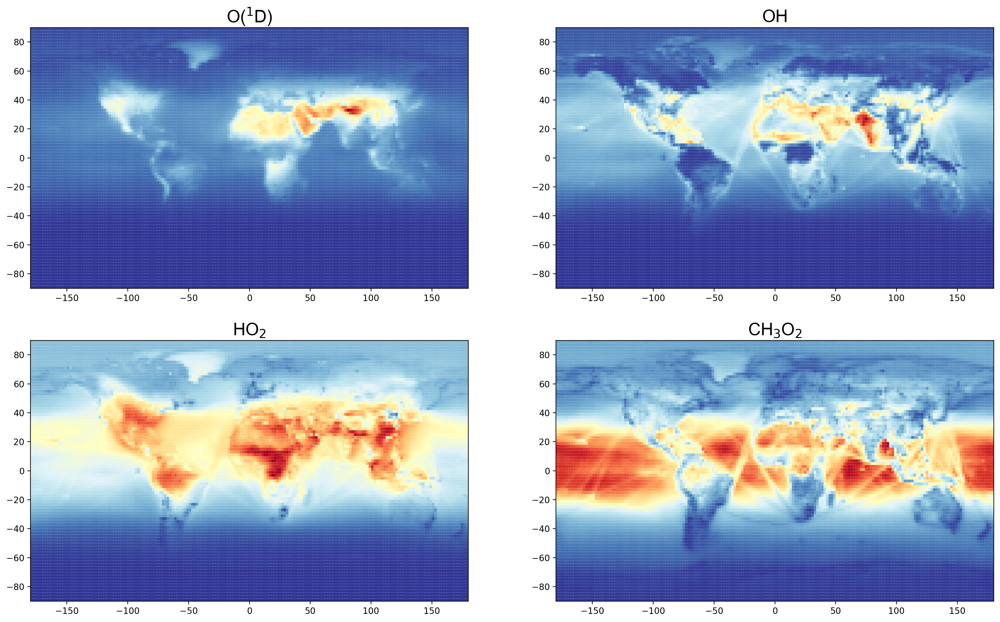

In [55]:
temp = dataset_JJA.groupby('loc').mean()

plt.figure(num=None, figsize=(20, 12), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(2,2,1)
plt.title('O(${^1}$D)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o1d_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,2)
plt.title('OH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,3)
plt.title('HO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,4)
plt.title('CH${_3}$O${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ch3o2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

In [56]:
dataset_JJA_land = dataset_JJA.merge(land, how='left', left_on=['longitude','latitude'], right_on=['longitude','latitude'])
dataset_JJA_land = dataset_JJA_land[dataset_JJA_land['land_global']==1]

(-90.0, 90.0)

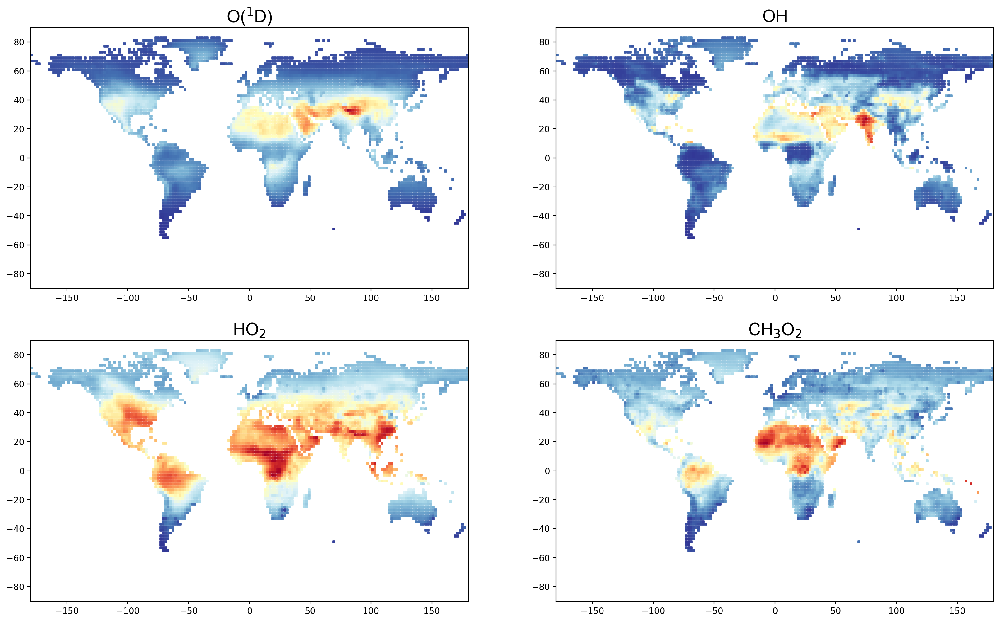

In [57]:
temp_land = dataset_JJA_land.groupby('loc_x').mean()

plt.figure(num=None, figsize=(20, 12), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp_land['longitude']
y = temp_land['latitude']

plt.subplot(2,2,1)
plt.title('O(${^1}$D)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['o1d_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,2)
plt.title('OH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['oh'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,3)
plt.title('HO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['ho2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,4)
plt.title('CH${_3}$O${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['ch3o2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

In [58]:
print("Mean: "+str(temp_land['o1d_mole_adj'].mean()*10**(3)))
print("Std: "+str(temp_land['o1d_mole_adj'].std()*10**(3)))
print("Median: "+str(temp_land['o1d_mole_adj'].median()*10**(3)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['o1d_mole_adj'],25)*10**(3)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['o1d_mole_adj'],75)*10**(3)))

Mean: 10.553865757020535
Std: 8.09533903286609
Median: 8.147530720429085
5th Percentile: 3.666156497514933
95th Percentile: 15.682458477946877


In [59]:
print("Mean: "+str(temp_land['oh_mole'].mean()*10**(-6)))
print("Std: "+str(temp_land['oh_mole'].std()*10**(-6)))
print("Median: "+str(temp_land['oh_mole'].median()*10**(-6)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['oh_mole'],25)*10**(-6)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['oh_mole'],75)*10**(-6)))

Mean: 1.8455286527068298
Std: 1.5686227731609368
Median: 1.2668807728377562
5th Percentile: 0.5813220025531763
95th Percentile: 2.875724851725222


In [60]:
print("Mean: "+str(temp_land['ho2_mole_adj'].mean()*10**(-8)))
print("Std: "+str(temp_land['ho2_mole_adj'].std()*10**(-8)))
print("Median: "+str(temp_land['ho2_mole_adj'].median()*10**(-8)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['ho2_mole_adj'],25)*10**(-8)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['ho2_mole_adj'],75)*10**(-8)))

Mean: 0.5654797354919564
Std: 0.25068145148257254
Median: 0.5123515555149576
5th Percentile: 0.36105615207668024
95th Percentile: 0.7586137465747297


In [61]:
print("Mean: "+str(temp_land['ch3o2_mole_adj'].mean()*10**(-8)))
print("Std: "+str(temp_land['ch3o2_mole_adj'].std()*10**(-8)))
print("Median: "+str(temp_land['ch3o2_mole_adj'].median()*10**(-8)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['ch3o2_mole_adj'],25)*10**(-8)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['ch3o2_mole_adj'],75)*10**(-8)))

Mean: 0.23042241129146762
Std: 0.12585515295021
Median: 0.19179324200937362
5th Percentile: 0.14924387657891225
95th Percentile: 0.28201259745292606


#### Observe December-January-February 

In [62]:
dataset_DJF = dataset[dataset['month']<3]

(-90.0, 90.0)

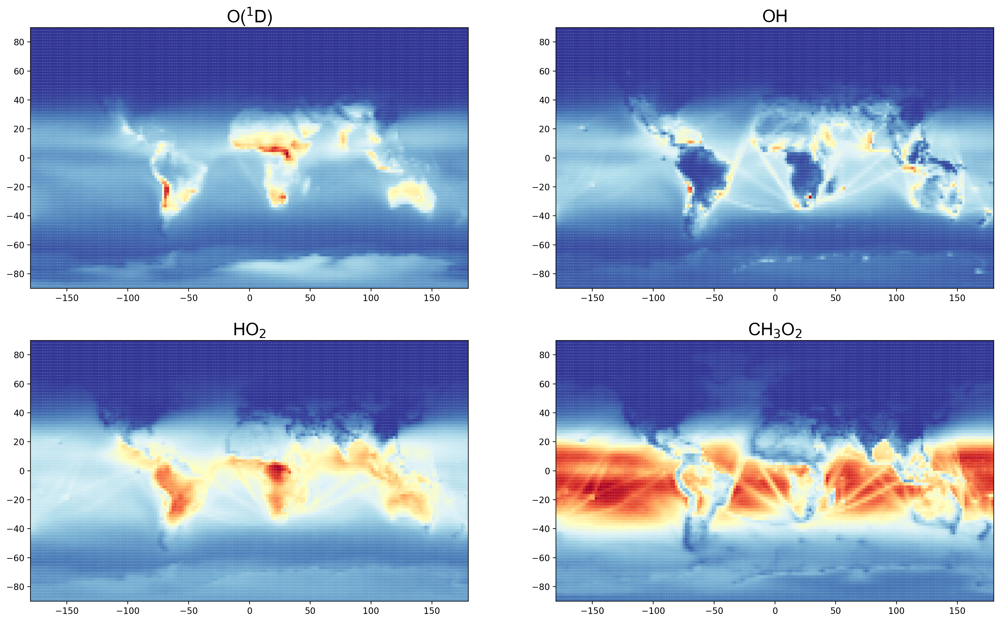

In [63]:
temp = dataset_DJF.groupby('loc').mean()

plt.figure(num=None, figsize=(20, 12), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(2,2,1)
plt.title('O(${^1}$D)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o1d_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,2)
plt.title('OH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,3)
plt.title('HO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,4)
plt.title('CH${_3}$O${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ch3o2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

In [64]:
dataset_DJF_land = dataset_DJF.merge(land, how='left', left_on=['longitude','latitude'], right_on=['longitude','latitude'])
dataset_DJF_land = dataset_DJF_land[dataset_DJF_land['land_global']==1]

(-90.0, 90.0)

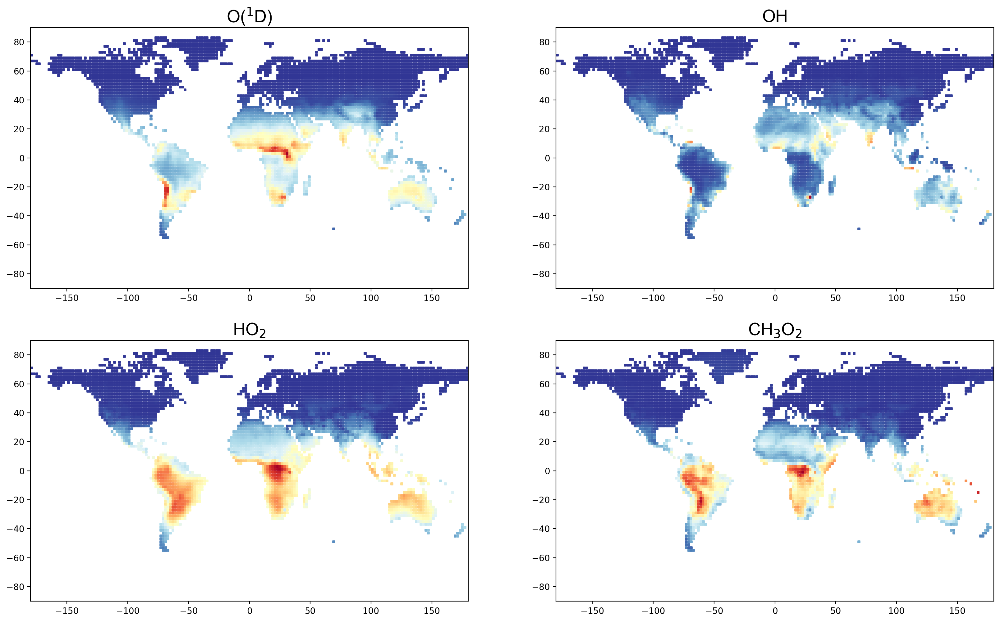

In [65]:
temp_land = dataset_DJF_land.groupby('loc_x').mean()

plt.figure(num=None, figsize=(20, 12), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp_land['longitude']
y = temp_land['latitude']

plt.subplot(2,2,1)
plt.title('O(${^1}$D)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['o1d_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,2)
plt.title('OH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['oh'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,3)
plt.title('HO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['ho2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,2,4)
plt.title('CH${_3}$O${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp_land['ch3o2_vmr_adj'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

In [66]:
print("Mean: "+str(temp_land['o1d_mole_adj'].mean()*10**(3)))
print("Std: "+str(temp_land['o1d_mole_adj'].std()*10**(3)))
print("Median: "+str(temp_land['o1d_mole_adj'].median()*10**(3)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['o1d_mole_adj'],25)*10**(3)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['o1d_mole_adj'],75)*10**(3)))

Mean: 4.34539632550087
Std: 5.3101938948660825
Median: 0.8481985071556045
5th Percentile: 0.04270645144421418
95th Percentile: 8.907242318919186


In [67]:
print("Mean: "+str(temp_land['oh_mole'].mean()*10**(-6)))
print("Std: "+str(temp_land['oh_mole'].std()*10**(-6)))
print("Median: "+str(temp_land['oh_mole'].median()*10**(-6)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['oh_mole'],25)*10**(-6)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['oh_mole'],75)*10**(-6)))

Mean: 0.7202854841731263
Std: 0.9371679253606598
Median: 0.23515962854628847
5th Percentile: 0.024008003616469736
95th Percentile: 1.2540432287213445


In [68]:
print("Mean: "+str(temp_land['ho2_mole_adj'].mean()*10**(-8)))
print("Std: "+str(temp_land['ho2_mole_adj'].std()*10**(-8)))
print("Median: "+str(temp_land['ho2_mole_adj'].median()*10**(-8)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['ho2_mole_adj'],25)*10**(-8)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['ho2_mole_adj'],75)*10**(-8)))

Mean: 0.2644298485230426
Std: 0.3423357698322168
Median: 0.028543960536946675
5th Percentile: 0.003963461160177152
95th Percentile: 0.54600328169708


In [69]:
print("Mean: "+str(temp_land['ch3o2_mole'].mean()*10**(-8)))
print("Std: "+str(temp_land['ch3o2_mole'].std()*10**(-8)))
print("Median: "+str(temp_land['ch3o2_mole'].median()*10**(-8)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['ch3o2_mole'],25)*10**(-8)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['ch3o2_mole'],75)*10**(-8)))

Mean: 0.09083710890314745
Std: 0.23832874824838515
Median: 0.005260735761508839
5th Percentile: 0.0006346604011292048
95th Percentile: 0.03859328508214241


In [70]:
print("Mean: "+str(temp_land['ch3o2_mole_adj'].mean()*10**(-8)))
print("Std: "+str(temp_land['ch3o2_mole_adj'].std()*10**(-8)))
print("Median: "+str(temp_land['ch3o2_mole_adj'].median()*10**(-8)))
print("5th Percentile: "+str(np.nanpercentile(temp_land['ch3o2_mole_adj'],25)*10**(-8)))
print("95th Percentile: "+str(np.nanpercentile(temp_land['ch3o2_mole_adj'],75)*10**(-8)))

Mean: 0.11297816120642237
Std: 0.15847321477362972
Median: 0.01202435126685091
5th Percentile: 0.0018670807321068956
95th Percentile: 0.2191858370477478


### 计算四个主要自由基的budget占比

#### O(1D)生成速率

In [165]:
dataset['o1d_photo_prod'] = dataset['photo1d']*dataset['o3_mole']
dataset['o1d_photo_prod'].mean()

4010539.505222818

#### O(1D)降解速率

In [244]:
dataset['o1d_n2_loss'] = dataset['k1']*dataset['n2_mole']*dataset['o1d_mole_adj']
dataset['o1d_o2_loss'] = dataset['k2']*dataset['o2_mole']*dataset['o1d_mole_adj']
dataset['o1d_h2o_loss'] = dataset['k3']*dataset['h2o_mole']*dataset['o1d_mole_adj']

In [245]:
dataset['oh_o1d_h2o_prod'] = 2*dataset['k3']*dataset['h2o_mole']*dataset['o1d_mole_adj']
dataset['oh_ho2_no_prod'] = dataset['k10']*dataset['ho2_mole_adj']*dataset['no_mole']
dataset['oh_ho2_o3_prod'] = dataset['k11']*dataset['ho2_mole_adj']*dataset['o3_mole']

In [246]:
dataset['k8'] = 1.85*10**(-12)*np.exp(-1690/dataset_land['tas'])
dataset['oh_co_loss'] = dataset['lossco_mole']
#dataset['oh_ch4_loss'] = dataset['lossch4_mole']
#dataset['oh_co_loss'] = dataset['k5']*dataset['oh_mole']*dataset['co_mole']
dataset['oh_ch4_loss'] = dataset['k8']*dataset['oh_mole']*dataset['ch4_mole']
dataset['oh_hcho_loss'] = dataset['k6']*dataset['oh_mole']*dataset['hcho_mole']
dataset['oh_ho2_loss'] = dataset['k13']*dataset['ho2_mole_adj']*dataset['oh_mole']
dataset['oh_o3_loss'] = dataset['k7']*dataset['oh_mole']*dataset['o3_mole']
dataset['oh_ch3ooh_loss'] = dataset['k9']*dataset['oh_mole']*dataset['ch3ooh_mole']

In [247]:
print(dataset['oh_co_loss'].mean())
print(dataset['oh_ch4_loss'].mean())
print(dataset['oh_hcho_loss'].mean())
print(dataset['oh_ho2_loss'].mean())
print(dataset['oh_o3_loss'].mean())
print(dataset['oh_ch3ooh_loss'].mean())

494908.0823703807
339813.09945399605
169550.164043533
6682.3544354067635
64058.02438809967
91602.38546555056


In [248]:
print(dataset['oh_o1d_h2o_prod'].mean())
print(dataset['oh_ho2_no_prod'].mean())
print(dataset['oh_ho2_o3_prod'].mean())

710225.656110936
1603185.2339547789
50100.6118664958


In [249]:
dataset['ho2_co_oh_prod'] = dataset['lossco_mole']
dataset['ho2_ch3o2_no_prod'] = dataset['k14']*dataset['ch3o2_mole_adj']*dataset['no_mole']
dataset['ho2_oh_hcho_prod'] = dataset['k16']*dataset['oh_mole']*dataset['hcho_mole']
dataset['ho2_oh_o3_prod'] = dataset['k7']*dataset['oh_mole']*dataset['o3_mole']

In [250]:
dataset['ho2_no_loss'] = dataset['k10']*dataset['ho2_mole_adj']*dataset['no_mole']
dataset['ho2_o3_loss'] = dataset['k11']*dataset['ho2_mole_adj']*dataset['o3_mole']
dataset['ho2_ch3o2_loss'] = dataset['k15']*dataset['ho2_mole_adj']*dataset['ch3o2_mole_adj']
dataset['ho2_ho2_loss'] = 2*dataset['k12']*dataset['ho2_mole_adj']*dataset['ho2_mole_adj']
dataset['ho2_oh_loss'] = dataset['k13']*dataset['ho2_mole_adj']*dataset['oh_mole']

In [251]:
print(dataset['ho2_co_oh_prod'].mean())
print(dataset['ho2_ch3o2_no_prod'].mean())
print(dataset['ho2_oh_hcho_prod'].mean())
print(dataset['ho2_oh_o3_prod'].mean())

494908.0823703807
421362.3653159974
7017.076184558128
64058.02438809967


In [252]:
print(dataset['ho2_no_loss'].mean())
print(dataset['ho2_o3_loss'].mean())
print(dataset['ho2_ch3o2_loss'].mean())
print(dataset['ho2_ho2_loss'].mean())
print(dataset['ho2_oh_loss'].mean())

1603185.2339547789
50100.6118664958
6539.934900078789
5090.397001541719
6682.3544354067635


In [253]:
dataset['ch3o2_oh_ch4_prod'] = dataset['lossch4_mole']
dataset['ch3o2_oh_ch3ooh_prod'] = dataset['k9b']*dataset['oh_mole']*dataset['ch3ooh_mole']

In [254]:
dataset['ch3o2_no_loss'] = dataset['k14']*dataset['ch3o2_mole_adj']*dataset['no_mole']
dataset['ch3o2_ho2_loss'] = dataset['k15']*dataset['ch3o2_mole_adj']*dataset['ho2_mole_adj']
dataset['ch3o2_ch3o2_loss'] = 2*dataset['k16']*dataset['ch3o2_mole_adj']*dataset['ch3o2_mole_adj']

In [255]:
print(dataset['ch3o2_oh_ch4_prod'].mean())
print(dataset['ch3o2_oh_ch3ooh_prod'].mean())

267172.3900935375
43174.191653339665


In [256]:
print(dataset['ch3o2_no_loss'].mean())
print(dataset['ch3o2_ho2_loss'].mean())
print(dataset['ch3o2_ch3o2_loss'].mean())

421362.3653159974
6539.934900078789
757.2385205182343


In [257]:
list(dataset)

['longitude',
 'latitude',
 't',
 'loc',
 'o3',
 'o3prod',
 'o3loss',
 'eminox',
 'emivoc',
 'tas',
 'hus',
 'aod',
 'bldep',
 'ua',
 'va',
 'ps',
 'jno2',
 'photo1d',
 'lossch4',
 'lossco',
 'no2',
 'no',
 'oh',
 'h2o',
 'pan',
 'hno3',
 'co',
 'hcho',
 'ch4',
 'ch3o2_mod',
 'ho2_mod',
 'o1d_mod',
 'o3_mole',
 'no2_mole',
 'no_mole',
 'h2o_mole',
 'co_mole',
 'hcho_mole',
 'oh_mole',
 'n2_mole',
 'o2_mole',
 'lossco_mole',
 'lossch4_mole',
 'o1d_mole',
 'ho2_mole',
 'ch3o2_mole',
 'ch3ooh_mole',
 'o1d_mod_vmr',
 'ho2_mod_vmr',
 'ch3o2_mod_vmr',
 'o1d_vmr',
 'ho2_vmr',
 'ch3o2_vmr',
 'o1d_mod_mole',
 'ho2_mod_mole',
 'ch3o2_mod_mole',
 'o1d_mole_adj',
 'ho2_mole_adj',
 'ch3o2_mole_adj',
 'k1',
 'k2',
 'k3',
 'k4',
 'k5',
 'k6',
 'k7',
 'k8',
 'k9',
 'k9a',
 'k9b',
 'k10',
 'k11',
 'k12',
 'k13',
 'k14',
 'k15',
 'k15a',
 'k15b',
 'k16',
 'pt1',
 'pt2',
 'pt4',
 'pt5',
 'pt6',
 'o3prod_mole',
 'o3loss_mole',
 'pt3',
 'pt7',
 'pt3_adj',
 'pt7_adj',
 'o3prod_mole_adj',
 'o3loss_mole_adj',

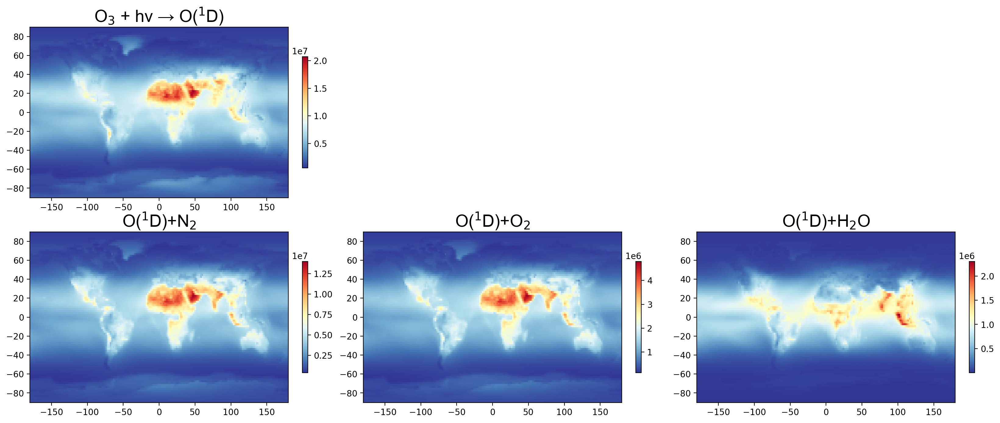

In [258]:
temp = dataset.groupby('loc').mean()

plt.figure(num=None, figsize=(20, 8), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(2,3,1)
plt.title('O${_3}$ + hv → O(${^1}$D)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o1d_photo_prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(2,3,4)
plt.title('O(${^1}$D)+N${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o1d_n2_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(2,3,5)
plt.title('O(${^1}$D)+O${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o1d_o2_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(2,3,6)
plt.title('O(${^1}$D)+H${_2}$O', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o1d_h2o_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

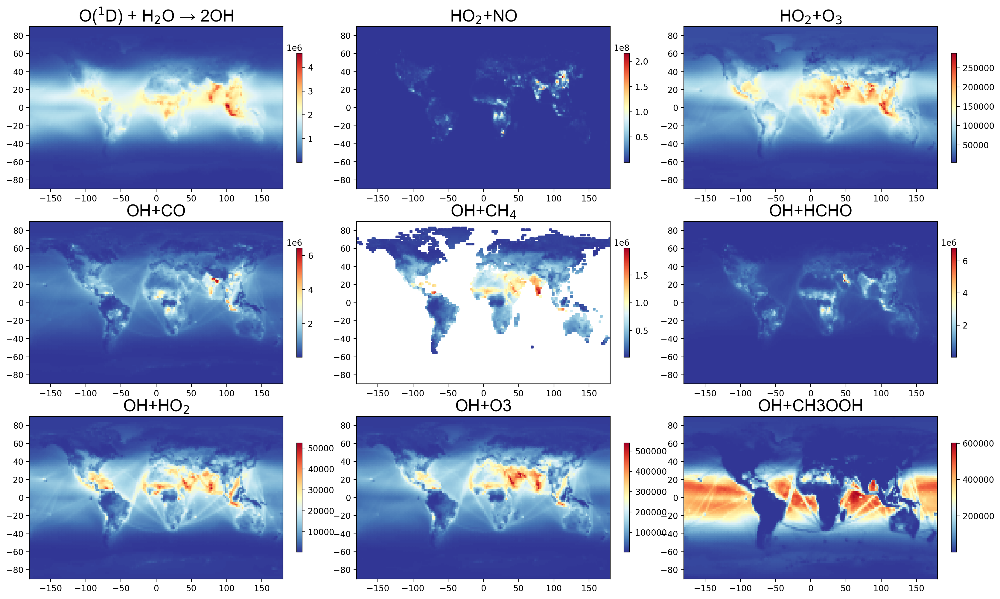

In [259]:
temp = dataset.groupby('loc').mean()

plt.figure(num=None, figsize=(20, 12), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(3,3,1)
plt.title('O(${^1}$D) + H${_2}$O → 2OH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh_o1d_h2o_prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,2)
plt.title('HO${_2}$+NO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh_ho2_no_prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,3)
plt.title('HO${_2}$+O${_3}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh_ho2_o3_prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)


plt.subplot(3,3,4)
plt.title('OH+CO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh_co_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,5)
plt.title('OH+CH${_4}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh_ch4_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,6)
plt.title('OH+HCHO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh_hcho_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,7)
plt.title('OH+HO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh_ho2_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,8)
plt.title('OH+O3', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh_o3_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,9)
plt.title('OH+CH3OOH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['oh_ch3ooh_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

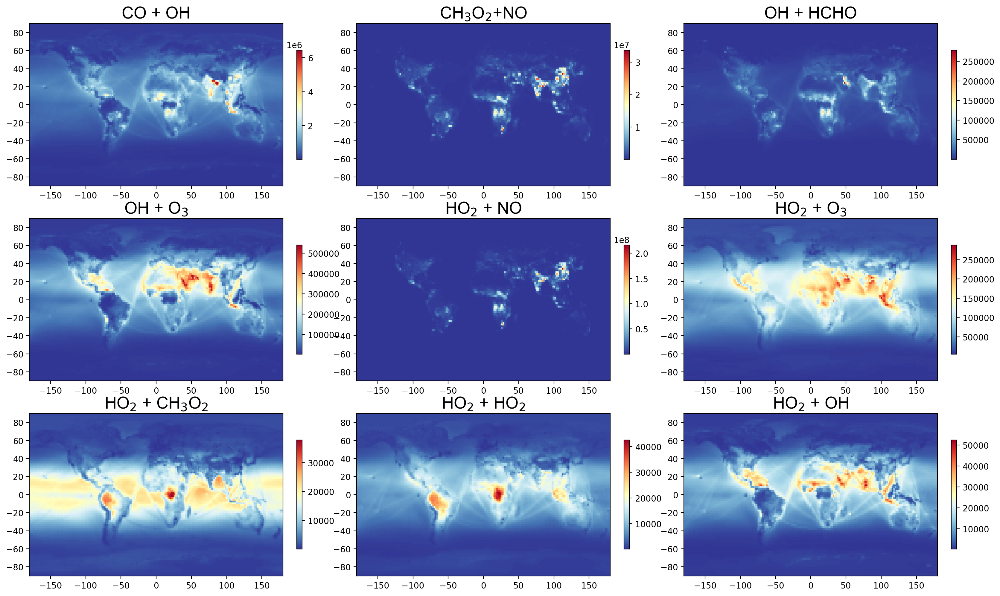

In [260]:
temp = dataset.groupby('loc').mean()

plt.figure(num=None, figsize=(20, 12), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(3,3,1)
plt.title('CO + OH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_co_oh_prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,2)
plt.title('CH${_3}$O${_2}$+NO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_ch3o2_no_prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,3)
plt.title('OH + HCHO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_oh_hcho_prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,4)
plt.title('OH + O${_3}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_oh_o3_prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)


plt.subplot(3,3,5)
plt.title('HO${_2}$ + NO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_no_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,6)
plt.title('HO${_2}$ + O${_3}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_o3_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,7)
plt.title('HO${_2}$ + CH${_3}$O${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_ch3o2_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,8)
plt.title('HO${_2}$ + HO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_ho2_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(3,3,9)
plt.title('HO${_2}$ + OH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_oh_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

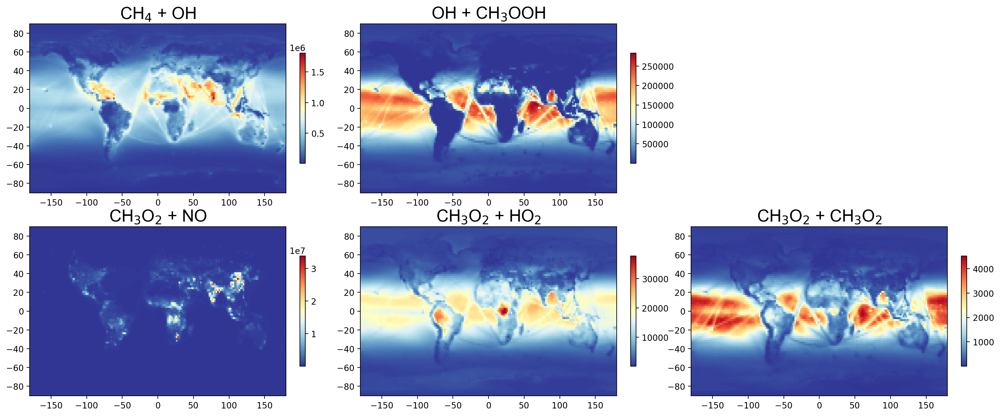

In [261]:
temp = dataset.groupby('loc').mean()

plt.figure(num=None, figsize=(20, 8), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(2,3,1)
plt.title('CH${_4}$ + OH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ch3o2_oh_ch4_prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(2,3,2)
plt.title('OH + CH${_3}$OOH', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ch3o2_oh_ch3ooh_prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(2,3,4)
plt.title('CH${_3}$O${_2}$ + NO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ch3o2_no_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(2,3,5)
plt.title('CH${_3}$O${_2}$ + HO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ch3o2_ho2_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

plt.subplot(2,3,6)
plt.title('CH${_3}$O${_2}$ + CH${_3}$O${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ch3o2_ch3o2_loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
plt.colorbar(fraction=0.02)

### 计算陆面自由基budget的组分配比

In [262]:
land = pd.read_csv('/Users/csuen/Documents/GitHub/ozone-budget/global_grid_2x2_label_continent.csv')

dataset_land = dataset.merge(land, how='left', left_on=['longitude','latitude'], right_on=['longitude','latitude'])
dataset_land = dataset_land[dataset_land['land_global']==1]

In [263]:
print(dataset_land['o1d_photo_prod'].mean())

5818674.781536731


In [264]:
print(dataset_land['o1d_n2_loss'].mean())
print(dataset_land['o1d_o2_loss'].mean())
print(dataset_land['o1d_h2o_loss'].mean())

4028151.9928614125
1376380.7452006992
471774.1514594397


In [265]:
print(dataset_land['oh_o1d_h2o_prod'].mean())
print(dataset_land['oh_ho2_no_prod'].mean())
print(dataset_land['oh_ho2_o3_prod'].mean())

943548.3029188794
6021688.35942984
70798.45113375623


In [266]:
print(dataset_land['oh_co_loss'].mean())
print(dataset_land['oh_hcho_loss'].mean())
print(dataset_land['oh_ch4_loss'].mean())
print(dataset_land['oh_o3_loss'].mean())
print(dataset_land['oh_ch3ooh_loss'].mean())
print(dataset_land['oh_ho2_loss'].mean())

721383.1864250706
377272.0478953613
339813.09945399605
91530.43567670013
12197.860474193825
8395.035745029558


In [267]:
print(dataset_land['ho2_co_oh_prod'].mean())
print(dataset_land['ho2_ch3o2_no_prod'].mean())
print(dataset_land['ho2_oh_o3_prod'].mean())
print(dataset_land['ho2_oh_hcho_prod'].mean())

721383.1864250706
1474384.8914606604
91530.43567670013
15620.371243825852


In [268]:
print(dataset_land['ho2_no_loss'].mean())
print(dataset_land['ho2_o3_loss'].mean())
print(dataset_land['ho2_ch3o2_loss'].mean())
print(dataset_land['ho2_ho2_loss'].mean())
print(dataset_land['ho2_oh_loss'].mean())

6021688.35942984
70798.45113375623
5752.151271080532
7518.648507487813
8395.035745029558


In [269]:
print(dataset_land['ch3o2_oh_ch4_prod'].mean())
print(dataset_land['ch3o2_oh_ch3ooh_prod'].mean())

283821.0876666015
5749.116283348089


In [270]:
print(dataset_land['ch3o2_no_loss'].mean())
print(dataset_land['ch3o2_ho2_loss'].mean())
print(dataset_land['ch3o2_ch3o2_loss'].mean())

1474384.8914606604
5752.151271080532
347.46339701904077


#### 计算JJA月份的budget配比

In [271]:
dataset_land_JJA = dataset_land[dataset_land['month']>5]
dataset_land_JJA = dataset_land_JJA[dataset_land_JJA['month']<9]

In [272]:
print(dataset_land_JJA['o1d_photo_prod'].mean())

8504571.785123287


In [273]:
print(dataset_land_JJA['o1d_n2_loss'].mean())
print(dataset_land_JJA['o1d_o2_loss'].mean())
print(dataset_land_JJA['o1d_h2o_loss'].mean())

5807185.668967228
1986059.546147302
695250.7240526051


In [274]:
print(dataset_land_JJA['oh_o1d_h2o_prod'].mean())
print(dataset_land_JJA['oh_ho2_no_prod'].mean())
print(dataset_land_JJA['oh_ho2_o3_prod'].mean())

1390501.4481052102
9788932.188003866
112092.62686351074


In [275]:
print(dataset_land_JJA['oh_co_loss'].mean())
print(dataset_land_JJA['oh_hcho_loss'].mean())
print(dataset_land_JJA['oh_ch4_loss'].mean())
print(dataset_land_JJA['oh_o3_loss'].mean())
print(dataset_land_JJA['oh_ch3ooh_loss'].mean())
print(dataset_land_JJA['oh_ho2_loss'].mean())

1037989.2457395698
599376.2117361621
511791.62820687564
149603.00952622507
20013.057494085686
14094.110983098875


In [276]:
print(dataset_land_JJA['ho2_co_oh_prod'].mean())
print(dataset_land_JJA['ho2_ch3o2_no_prod'].mean())
print(dataset_land_JJA['ho2_oh_o3_prod'].mean())
print(dataset_land_JJA['ho2_oh_hcho_prod'].mean())

1037989.2457395698
2343822.553980438
149603.00952622507
24776.164052320095


In [277]:
print(dataset_land_JJA['ho2_no_loss'].mean())
print(dataset_land_JJA['ho2_o3_loss'].mean())
print(dataset_land_JJA['ho2_ch3o2_loss'].mean())
print(dataset_land_JJA['ho2_ho2_loss'].mean())
print(dataset_land_JJA['ho2_oh_loss'].mean())

9788932.188003866
112092.62686351074
8233.061978273785
10963.481788971218
14094.110983098875


In [278]:
print(dataset_land_JJA['ch3o2_oh_ch4_prod'].mean())
print(dataset_land_JJA['ch3o2_oh_ch3ooh_prod'].mean())

424520.9127620532
9432.588195466811


In [279]:
print(dataset_land_JJA['ch3o2_no_loss'].mean())
print(dataset_land_JJA['ch3o2_ho2_loss'].mean())
print(dataset_land_JJA['ch3o2_ch3o2_loss'].mean())

2343822.553980438
8233.061978273785
491.1252528186081


#### 计算DJF月份的budget配比

In [280]:
dataset_land_DJF = dataset_land[dataset_land['month']<3]

In [281]:
print(dataset_land_DJF['o1d_photo_prod'].mean())

3510587.358572767


In [282]:
print(dataset_land_DJF['o1d_n2_loss'].mean())
print(dataset_land_DJF['o1d_o2_loss'].mean())
print(dataset_land_DJF['o1d_h2o_loss'].mean())

2452008.5690552467
837838.8078474519
319141.78363462054


In [283]:
print(dataset_land_DJF['oh_o1d_h2o_prod'].mean())
print(dataset_land_DJF['oh_ho2_no_prod'].mean())
print(dataset_land_DJF['oh_ho2_o3_prod'].mean())

638283.5672692411
3960498.202529286
39416.800785963416


In [284]:
print(dataset_land_DJF['oh_co_loss'].mean())
print(dataset_land_DJF['oh_hcho_loss'].mean())
print(dataset_land_DJF['oh_ch4_loss'].mean())
print(dataset_land_DJF['oh_o3_loss'].mean())
print(dataset_land_DJF['oh_ch3ooh_loss'].mean())
print(dataset_land_DJF['oh_ho2_loss'].mean())

450352.72823917615
236650.6529316919
186911.60738698905
42032.75907827486
6085.125371105915
4144.470120722386


In [285]:
print(dataset_land_DJF['ho2_co_oh_prod'].mean())
print(dataset_land_DJF['ho2_ch3o2_no_prod'].mean())
print(dataset_land_DJF['ho2_oh_o3_prod'].mean())
print(dataset_land_DJF['ho2_oh_hcho_prod'].mean())

450352.72823917615
963254.433494005
42032.75907827486
9804.872688701322


In [286]:
print(dataset_land_DJF['ho2_no_loss'].mean())
print(dataset_land_DJF['ho2_o3_loss'].mean())
print(dataset_land_DJF['ho2_ch3o2_loss'].mean())
print(dataset_land_DJF['ho2_ho2_loss'].mean())
print(dataset_land_DJF['ho2_oh_loss'].mean())

3960498.202529286
39416.800785963416
4239.986381553313
5285.795636796805
4144.470120722386


In [287]:
print(dataset_land_DJF['ch3o2_oh_ch4_prod'].mean())
print(dataset_land_DJF['ch3o2_oh_ch3ooh_prod'].mean())

157129.09691160428
2868.051608825494


In [288]:
print(dataset_land_DJF['ch3o2_no_loss'].mean())
print(dataset_land_DJF['ch3o2_ho2_loss'].mean())
print(dataset_land_DJF['ch3o2_ch3o2_loss'].mean())

963254.433494005
4239.986381553313
266.87287307938516


### 区分六大洲概述budget

In [289]:
dataset_NA = dataset_land[dataset_land['CONTINENT']=="North America"]
dataset_SA = dataset_land[dataset_land['CONTINENT']=="South America"]
dataset_EU = dataset_land[dataset_land['CONTINENT']=="Europe"]
dataset_AS = dataset_land[dataset_land['CONTINENT']=="Asia"]
dataset_AF = dataset_land[dataset_land['CONTINENT']=="Africa"]
dataset_OC = dataset_land[dataset_land['CONTINENT']=="Oceania"]
dataset_AS = dataset_land[dataset_land['CONTINENT']=="Australia"]
dataset_OC = dataset_OC.append(dataset_AS)

In [290]:
print(dataset_NA['o1d_photo_prod'].mean())

3032252.2940937025


In [291]:
print(dataset_NA['o1d_n2_loss'].mean())
print(dataset_NA['o1d_o2_loss'].mean())
print(dataset_NA['o1d_h2o_loss'].mean())

2070545.2880622766
703560.4191660318
216804.63080213184


In [292]:
print(dataset_NA['oh_o1d_h2o_prod'].mean())
print(dataset_NA['oh_ho2_no_prod'].mean())
print(dataset_NA['oh_ho2_o3_prod'].mean())

433609.2616042637
2042734.3181738127
37729.216314285615


In [293]:
print(dataset_NA['oh_co_loss'].mean())
print(dataset_NA['oh_hcho_loss'].mean())
print(dataset_NA['oh_ch4_loss'].mean())
print(dataset_NA['oh_o3_loss'].mean())
print(dataset_NA['oh_ch3ooh_loss'].mean())
print(dataset_NA['oh_ho2_loss'].mean())

377935.2936439871
173238.71025092155
173733.19128091258
43634.85545462273
4827.314541820385
4091.368746280072


In [294]:
print(dataset_NA['ho2_co_oh_prod'].mean())
print(dataset_NA['ho2_ch3o2_no_prod'].mean())
print(dataset_NA['ho2_oh_o3_prod'].mean())
print(dataset_NA['ho2_oh_hcho_prod'].mean())

377935.2936439871
541672.1058758649
43634.85545462273
7238.526431419153


In [295]:
print(dataset_NA['ho2_no_loss'].mean())
print(dataset_NA['ho2_o3_loss'].mean())
print(dataset_NA['ho2_ch3o2_loss'].mean())
print(dataset_NA['ho2_ho2_loss'].mean())
print(dataset_NA['ho2_oh_loss'].mean())

2042734.3181738127
37729.216314285615
2292.3955281562107
3343.229691167771
4091.368746280072


In [296]:
print(dataset_NA['ch3o2_oh_ch4_prod'].mean())
print(dataset_NA['ch3o2_oh_ch3ooh_prod'].mean())

140096.3235885801
2275.218075820565


In [297]:
print(dataset_NA['ch3o2_no_loss'].mean())
print(dataset_NA['ch3o2_ho2_loss'].mean())
print(dataset_NA['ch3o2_ch3o2_loss'].mean())

541672.1058758649
2292.3955281562107
113.762838856494


#### 南美洲

In [298]:
print(dataset_SA['o1d_photo_prod'].mean())

6467267.474672968


In [299]:
print(dataset_SA['o1d_n2_loss'].mean())
print(dataset_SA['o1d_o2_loss'].mean())
print(dataset_SA['o1d_h2o_loss'].mean())

4528942.965101951
1549765.0362385025
749139.7934785223


In [300]:
print(dataset_SA['oh_o1d_h2o_prod'].mean())
print(dataset_SA['oh_ho2_no_prod'].mean())
print(dataset_SA['oh_ho2_o3_prod'].mean())

1498279.5869570447
5091360.3970327
83484.29198910133


In [301]:
print(dataset_SA['oh_co_loss'].mean())
print(dataset_SA['oh_hcho_loss'].mean())
print(dataset_SA['oh_ch4_loss'].mean())
print(dataset_SA['oh_o3_loss'].mean())
print(dataset_SA['oh_ch3ooh_loss'].mean())
print(dataset_SA['oh_ho2_loss'].mean())

557473.6802366449
416537.60770050844
251085.24773925927
47468.435962368676
1755.198088268945
6556.4817649867655


In [302]:
print(dataset_SA['ho2_co_oh_prod'].mean())
print(dataset_SA['ho2_ch3o2_no_prod'].mean())
print(dataset_SA['ho2_oh_o3_prod'].mean())
print(dataset_SA['ho2_oh_hcho_prod'].mean())

557473.6802366449
1488966.0513912293
47468.435962368676
17217.088720796077


In [303]:
print(dataset_SA['ho2_no_loss'].mean())
print(dataset_SA['ho2_o3_loss'].mean())
print(dataset_SA['ho2_ch3o2_loss'].mean())
print(dataset_SA['ho2_ho2_loss'].mean())
print(dataset_SA['ho2_oh_loss'].mean())

5091360.3970327
83484.29198910133
12141.263887039939
15545.84820957438
6556.4817649867655


In [304]:
print(dataset_SA['ch3o2_oh_ch4_prod'].mean())
print(dataset_SA['ch3o2_oh_ch3ooh_prod'].mean())

201661.67044555684
827.2629393586814


In [305]:
print(dataset_SA['ch3o2_no_loss'].mean())
print(dataset_SA['ch3o2_ho2_loss'].mean())
print(dataset_SA['ch3o2_ch3o2_loss'].mean())

1488966.0513912293
12141.263887039939
735.3063444726391


#### 欧洲

In [306]:
print(dataset_EU['o1d_photo_prod'].mean())

print(dataset_EU['o1d_n2_loss'].mean())
print(dataset_EU['o1d_o2_loss'].mean())
print(dataset_EU['o1d_h2o_loss'].mean())

print(dataset_EU['oh_o1d_h2o_prod'].mean())
print(dataset_EU['oh_ho2_no_prod'].mean())
print(dataset_EU['oh_ho2_o3_prod'].mean())

print(dataset_EU['oh_co_loss'].mean())
print(dataset_EU['oh_hcho_loss'].mean())
print(dataset_EU['oh_ch4_loss'].mean())
print(dataset_EU['oh_o3_loss'].mean())
print(dataset_EU['oh_ch3ooh_loss'].mean())
print(dataset_EU['oh_ho2_loss'].mean())

print(dataset_EU['ho2_co_oh_prod'].mean())
print(dataset_EU['ho2_ch3o2_no_prod'].mean())
print(dataset_EU['ho2_oh_o3_prod'].mean())
print(dataset_EU['ho2_oh_hcho_prod'].mean())

print(dataset_EU['ho2_no_loss'].mean())
print(dataset_EU['ho2_o3_loss'].mean())
print(dataset_EU['ho2_ch3o2_loss'].mean())
print(dataset_EU['ho2_ho2_loss'].mean())
print(dataset_EU['ho2_oh_loss'].mean())

print(dataset_EU['ch3o2_oh_ch4_prod'].mean())
print(dataset_EU['ch3o2_oh_ch3ooh_prod'].mean())

print(dataset_EU['ch3o2_no_loss'].mean())
print(dataset_EU['ch3o2_ho2_loss'].mean())
print(dataset_EU['ch3o2_ch3o2_loss'].mean())

2629193.250287299
1967244.8106200718
669680.7586613364
193551.63428755742
387103.26857511484
2425145.3826050176
34909.90507926434
455892.11359606736
190342.93752759596
228734.79418035076
60604.70931164975
894.7449256442391
4330.760935419922
455892.11359606736
603247.1597285349
60604.70931164975
8004.395733302806
2425145.3826050176
34909.90507926434
1410.8062452461018
2407.1111300436605
4330.760935419922
202718.9618197872
421.7126956278308
603247.1597285349
1410.8062452461018
59.40173999867331


In [307]:
print(dataset_AF['o1d_photo_prod'].mean())

print(dataset_AF['o1d_n2_loss'].mean())
print(dataset_AF['o1d_o2_loss'].mean())
print(dataset_AF['o1d_h2o_loss'].mean())

print(dataset_AF['oh_o1d_h2o_prod'].mean())
print(dataset_AF['oh_ho2_no_prod'].mean())
print(dataset_AF['oh_ho2_o3_prod'].mean())

print(dataset_AF['oh_co_loss'].mean())
print(dataset_AF['oh_hcho_loss'].mean())
print(dataset_AF['oh_ch4_loss'].mean())
print(dataset_AF['oh_o3_loss'].mean())
print(dataset_AF['oh_ch3ooh_loss'].mean())
print(dataset_AF['oh_ho2_loss'].mean())

print(dataset_AF['ho2_co_oh_prod'].mean())
print(dataset_AF['ho2_ch3o2_no_prod'].mean())
print(dataset_AF['ho2_oh_o3_prod'].mean())
print(dataset_AF['ho2_oh_hcho_prod'].mean())

print(dataset_AF['ho2_no_loss'].mean())
print(dataset_AF['ho2_o3_loss'].mean())
print(dataset_AF['ho2_ch3o2_loss'].mean())
print(dataset_AF['ho2_ho2_loss'].mean())
print(dataset_AF['ho2_oh_loss'].mean())

print(dataset_AF['ch3o2_oh_ch4_prod'].mean())
print(dataset_AF['ch3o2_oh_ch3ooh_prod'].mean())

print(dataset_AF['ch3o2_no_loss'].mean())
print(dataset_AF['ch3o2_ho2_loss'].mean())
print(dataset_AF['ch3o2_ch3o2_loss'].mean())

11523399.06192632
7880874.214114507
2700861.4079301236
921306.9895657665
1842613.979131533
9437846.723094393
141115.20368618466
1307832.8022365207
741999.0105222174
652723.6794595375
177180.76704902184
48637.95272196141
18027.736226945915
1307832.8022365207
2396577.4559463114
177180.76704902184
30565.65452422383
9437846.723094393
141115.20368618466
13078.877935156797
15720.275217258823
18027.736226945915
562781.2289817526
22924.122355238742
2396577.4559463114
13078.877935156797
864.1964014439279


In [308]:
print(dataset_AS['o1d_photo_prod'].mean())

print(dataset_AS['o1d_n2_loss'].mean())
print(dataset_AS['o1d_o2_loss'].mean())
print(dataset_AS['o1d_h2o_loss'].mean())

print(dataset_AS['oh_o1d_h2o_prod'].mean())
print(dataset_AS['oh_ho2_no_prod'].mean())
print(dataset_AS['oh_ho2_o3_prod'].mean())

print(dataset_AS['oh_co_loss'].mean())
print(dataset_AS['oh_hcho_loss'].mean())
print(dataset_AS['oh_ch4_loss'].mean())
print(dataset_AS['oh_o3_loss'].mean())
print(dataset_AS['oh_ch3ooh_loss'].mean())
print(dataset_AS['oh_ho2_loss'].mean())

print(dataset_AS['ho2_co_oh_prod'].mean())
print(dataset_AS['ho2_ch3o2_no_prod'].mean())
print(dataset_AS['ho2_oh_o3_prod'].mean())
print(dataset_AS['ho2_oh_hcho_prod'].mean())

print(dataset_AS['ho2_no_loss'].mean())
print(dataset_AS['ho2_o3_loss'].mean())
print(dataset_AS['ho2_ch3o2_loss'].mean())
print(dataset_AS['ho2_ho2_loss'].mean())
print(dataset_AS['ho2_oh_loss'].mean())

print(dataset_AS['ch3o2_oh_ch4_prod'].mean())
print(dataset_AS['ch3o2_oh_ch3ooh_prod'].mean())

print(dataset_AS['ch3o2_no_loss'].mean())
print(dataset_AS['ch3o2_ho2_loss'].mean())
print(dataset_AS['ch3o2_ch3o2_loss'].mean())

6852452.464266703
4860649.649966448
1663783.3205259216
585376.7052516851
1170753.4105033702
1673213.878727392
74129.8278912502
599109.2828569547
331850.24885772937
439176.6762272822
81688.11650602841
18295.39821493807
10314.46703989637
599109.2828569547
600107.3713128128
81688.11650602841
13674.39029055627
1673213.878727392
74129.8278912502
8218.20425400715
9017.990412898758
10314.46703989637
397941.66187583236
8623.018111280078
600107.3713128128
8218.20425400715
577.9740157286333


In [309]:
print(dataset_OC['o1d_photo_prod'].mean())

print(dataset_OC['o1d_n2_loss'].mean())
print(dataset_OC['o1d_o2_loss'].mean())
print(dataset_OC['o1d_h2o_loss'].mean())

print(dataset_OC['oh_o1d_h2o_prod'].mean())
print(dataset_OC['oh_ho2_no_prod'].mean())
print(dataset_OC['oh_ho2_o3_prod'].mean())

print(dataset_OC['oh_co_loss'].mean())
print(dataset_OC['oh_hcho_loss'].mean())
print(dataset_OC['oh_ch4_loss'].mean())
print(dataset_OC['oh_o3_loss'].mean())
print(dataset_OC['oh_ch3ooh_loss'].mean())
print(dataset_OC['oh_ho2_loss'].mean())

print(dataset_OC['ho2_co_oh_prod'].mean())
print(dataset_OC['ho2_ch3o2_no_prod'].mean())
print(dataset_OC['ho2_oh_o3_prod'].mean())
print(dataset_OC['ho2_oh_hcho_prod'].mean())

print(dataset_OC['ho2_no_loss'].mean())
print(dataset_OC['ho2_o3_loss'].mean())
print(dataset_OC['ho2_ch3o2_loss'].mean())
print(dataset_OC['ho2_ho2_loss'].mean())
print(dataset_OC['ho2_oh_loss'].mean())

print(dataset_OC['ch3o2_oh_ch4_prod'].mean())
print(dataset_OC['ch3o2_oh_ch3ooh_prod'].mean())

print(dataset_OC['ch3o2_no_loss'].mean())
print(dataset_OC['ch3o2_ho2_loss'].mean())
print(dataset_OC['ch3o2_ch3o2_loss'].mean())

6607932.986000018
4670175.430367613
1598432.8281873167
568586.5624793482
1137173.1249586963
1596308.0069686605
71294.35194885272
585451.478709574
317350.5233006985
431000.1552502286
79367.79312170872
22261.31534590213
9979.925282162298
585451.478709574
572619.1881197977
79367.79312170872
13081.967185598296
1596308.0069686605
71294.35194885272
8012.002389832329
8639.211301117362
9979.925282162298
391128.04770364496
10492.240898691965
572619.1881197977
8012.002389832329
587.6160030050816


In [310]:
dataset_land['hcho'].median()

5.30181315e-10

In [311]:
dataset_land['ch4'].median()

1.8139626e-06

In [312]:
dataset_land['lossch4'].median()

2.2032968499999998e-13

In [313]:
dataset_land['rate_OH_HCHO'] = dataset_land['k6']*dataset['oh_mole']*dataset['hcho_mole']
dataset_land['rate_OH_CH4'] = dataset_land['k8']*dataset['oh_mole']*dataset['ch4_mole']

In [314]:
dataset_land['rate_OH_HCHO'].mean()

377272.0478953613

In [315]:
dataset_land['rate_OH_CH4'].mean()

339813.09945399605

In [316]:
dataset_land['lossch4_mole'].mean()

283821.0876666015

In [317]:
dataset_land['ch4_mole_rev'] = dataset_land['lossch4_mole']/dataset_land['k8']/dataset['oh_mole']

In [318]:
dataset_land['ch4_mole_rev'].mean()/dataset_land['hcho_mole'].mean()

1411.662814078691

In [319]:
dataset_land['hcho'].mean()

1.1102431096874567e-09

In [320]:
dataset_land['ch4_mole'].mean()/dataset_land['hcho_mole'].mean()

1722.6955568769972

In [321]:
dataset_land['k8'] = 1.85*10**(-12)*np.exp(-1690/dataset_land['tas'])